# Tetris Training Data Analysis

pygame 2.6.1 (SDL 2.28.4, Python 3.12.7)
Hello from the pygame community. https://www.pygame.org/contribute.html
Successfully loaded 1825 data points from tetris_training_data.json

--- Data Overview ---
Total logged actions: 1825

Example Data Point:
  board_state: (2D array of shape (20, 10))
  current_block_shape: SquareBlock
  current_block_pos: [4, 0]
  next_block_shape: SquareBlock
  action: 1073741905

--- Action Analysis ---
Action Distribution:
  Soft Drop (1073741905): 505 (27.67%) 
  Right (1073741903): 482 (26.41%) 
  Rotate (1073741906): 422 (23.12%) 
  Left (1073741904): 416 (22.79%) 

--- Block Type Analysis ---
Current Block Shape Distribution:LBlock: 545 (29.86%) 
  TBlock: 424 (23.23%) 
  SquareBlock: 341 (18.68%) 
  ZBlock: 324 (17.75%) 
  LineBlock: 191 (10.47%) 

Next Block Shape Distribution:LBlock: 440 (24.11%) 
  SquareBlock: 428 (23.45%) 
  TBlock: 362 (19.84%) 
  ZBlock: 336 (18.41%) 
  LineBlock: 259 (14.19%) 

--- Generating Visualizations ---


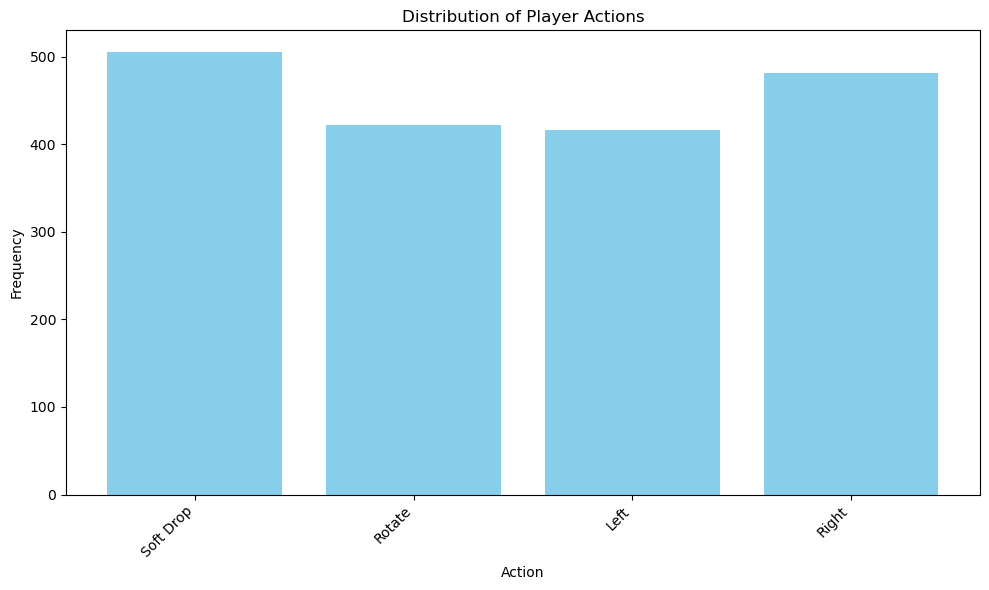


--- Interactive Board State Visualization ---


interactive(children=(IntSlider(value=0, description='Data Point Index:', max=1824), Output()), _dom_classes=(…


Analysis complete. Please upload 'analyze_tetris_data.ipynb' to Google Colab to run.


In [1]:
import json
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
from ipywidgets import interact, IntSlider
from IPython.display import display, HTML

# Try importing pygame, but handle if it's not available (e.g., in Colab)
try:
    import pygame
    # Define a mapping for Pygame keys to readable names
    ACTION_MAP = {
        pygame.K_LEFT: "Left",
        pygame.K_RIGHT: "Right",
        pygame.K_UP: "Rotate",
        pygame.K_DOWN: "Soft Drop",
        pygame.K_p: "Pause",
        pygame.K_RETURN: "Enter (Menu/Restart)",
    }
    def get_action_name(key_code):
        return ACTION_MAP.get(key_code, f"Unknown Key ({key_code})")
except ImportError:
    print("Pygame not found. Action key codes will be displayed as numbers.")
    def get_action_name(key_code):
        return str(key_code)
    

# Load the data
file_path = 'tetris_training_data.json'
try:
    with open(file_path, 'r') as f:
        data = json.load(f)
    print(f"Successfully loaded {len(data)} data points from {file_path}")
except FileNotFoundError:
    print(f"Error: {file_path} not found. Please ensure you have run the NNAI Player mode in the Tetris game to generate data.")
    data = []
except json.JSONDecodeError:
    print(f"Error: Could not decode JSON from {file_path}. File might be corrupted or empty.")
    data = []

if not data:
    print("No data to analyze. Exiting.")
else:
    # --- Basic Data Overview ---
    print("\n--- Data Overview ---")
    print(f"Total logged actions: {len(data)}")
    
    # Example of a single data point
    if data:
        print("\nExample Data Point:")
        for key, value in data[0].items():
            if key == "board_state":
                print(f"  {key}: (2D array of shape {np.array(value).shape})")
            else:
                print(f"  {key}: {value}")

    # --- Analysis of Actions ---
    print("\n--- Action Analysis ---")
    actions = [dp['action'] for dp in data]
    action_counts = Counter(actions)
    
    print("Action Distribution:")
    for action_code, count in action_counts.most_common():
        print(f"  {get_action_name(action_code)} ({action_code}): {count} ({count/len(data)*100:.2f}%) ")

    # --- Analysis of Block Types ---
    print("\n--- Block Type Analysis ---")
    current_block_shapes = [dp['current_block_shape'] for dp in data if dp['current_block_shape']]
    next_block_shapes = [dp['next_block_shape'] for dp in data if dp['next_block_shape']]
    
    current_block_counts = Counter(current_block_shapes)
    next_block_counts = Counter(next_block_shapes)

    print("Current Block Shape Distribution:" + "\n  ".join([f"{shape}: {count} ({count/len(current_block_shapes)*100:.2f}%) " for shape, count in current_block_counts.most_common()]))

    print("\nNext Block Shape Distribution:" + "\n  ".join([f"{shape}: {count} ({count/len(next_block_shapes)*100:.2f}%) " for shape, count in next_block_counts.most_common()]))

    # --- Visualization: Action Distribution (Bar Chart) ---
    print("\n--- Generating Visualizations ---")
    action_names = [get_action_name(code) for code in action_counts.keys()]
    counts = list(action_counts.values())

    plt.figure(figsize=(10, 6))
    plt.bar(action_names, counts, color='skyblue')
    plt.xlabel('Action')
    plt.ylabel('Frequency')
    plt.title('Distribution of Player Actions')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    # --- Interactive Board State Visualization ---
    print("\n--- Interactive Board State Visualization ---")

    def display_board_state_interactive(index):
        if not (0 <= index < len(data)):
            print("Index out of bounds.")
            return

        dp = data[index]
        board_state = np.array(dp['board_state'])
        action_taken = dp['action']
        current_block_shape = dp['current_block_shape']
        current_block_pos = dp['current_block_pos']
        next_block_shape = dp['next_block_shape']

        fig, ax = plt.subplots(figsize=(8, 10))
        ax.imshow(board_state, cmap='binary', origin='upper')
        ax.set_title(f'Board State at Index {index}')
        ax.set_xlabel('Column')
        ax.set_ylabel('Row')
        ax.set_xticks(np.arange(board_state.shape[1]))
        ax.set_yticks(np.arange(board_state.shape[0]))
        ax.grid(True, color='gray', linewidth=0.5)
        plt.show()

        display(HTML(f"<b>Action Taken:</b> {get_action_name(action_taken)} ({action_taken})<br>" +
                     f"<b>Current Block:</b> {current_block_shape} at {current_block_pos}<br>" +
                     f"<b>Next Block:</b> {next_block_shape}"))

    # Create slider for interactive visualization
    if data:
        slider = IntSlider(min=0, max=len(data) - 1, step=1, description='Data Point Index:')
        interact(display_board_state_interactive, index=slider)
    else:
        print("Cannot create interactive visualization: No data loaded.")

    print("\nAnalysis complete. Please upload 'analyze_tetris_data.ipynb' to Google Colab to run.")


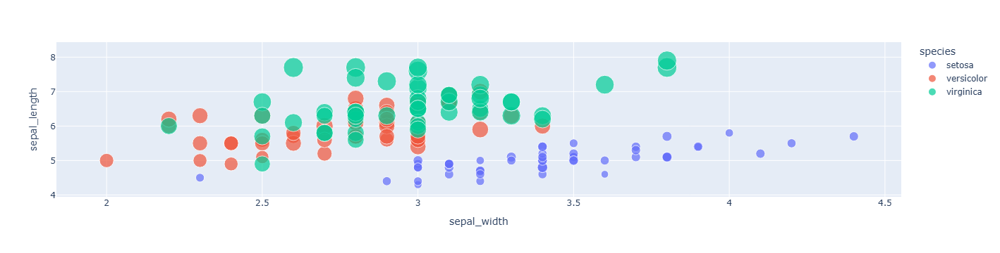

In [5]:
import plotly.express as px
import pandas as pd

# Load the Iris dataset, which is included with Plotly Express
# This dataset contains measurements of iris flowers, including sepal and petal dimensions, and species.
df = px.data.iris()

# Create an interactive scatter plot
# x: column for the x-axis (sepal_width)
# y: column for the y-axis (sepal_length)
# color: column to color points by (species), which automatically creates a legend and allows filtering. [3, 5]
# size: column to size points by (petal_length), creating a 'bubble chart' effect. [1]
# hover_data: additional columns to show when hovering over a point. [1]
fig = px.scatter(df,
                 x="sepal_width",
                 y="sepal_length",
                 color="species",
                 size='petal_length',
                 hover_data=['petal_width', 'species'])

# Display the plot
# When you run this code, Plotly will open an interactive plot in your default web browser
# or display it inline if you are in an environment like Jupyter Notebook.
fig.show()

Successfully loaded 1825 data points from tetris_training_data.json

--- Data Overview ---
Total logged actions: 1825

Example Data Point:
  board_state: (2D array of shape (20, 10))
  current_block_shape: SquareBlock
  current_block_pos: [4, 0]
  next_block_shape: SquareBlock
  action: 1073741905

--- Action Analysis ---
Action Distribution:
  Soft Drop (1073741905): 505 (27.67%) 
  Right (1073741903): 482 (26.41%) 
  Rotate (1073741906): 422 (23.12%) 
  Left (1073741904): 416 (22.79%) 

--- Block Type Analysis ---
Current Block Shape Distribution:
  LBlock: 545 (29.86%) 
  TBlock: 424 (23.23%) 
  SquareBlock: 341 (18.68%) 
  ZBlock: 324 (17.75%) 
  LineBlock: 191 (10.47%) 

Next Block Shape Distribution:
  LBlock: 440 (24.11%) 
  SquareBlock: 428 (23.45%) 
  TBlock: 362 (19.84%) 
  ZBlock: 336 (18.41%) 
  LineBlock: 259 (14.19%) 

--- Generating Visualizations ---


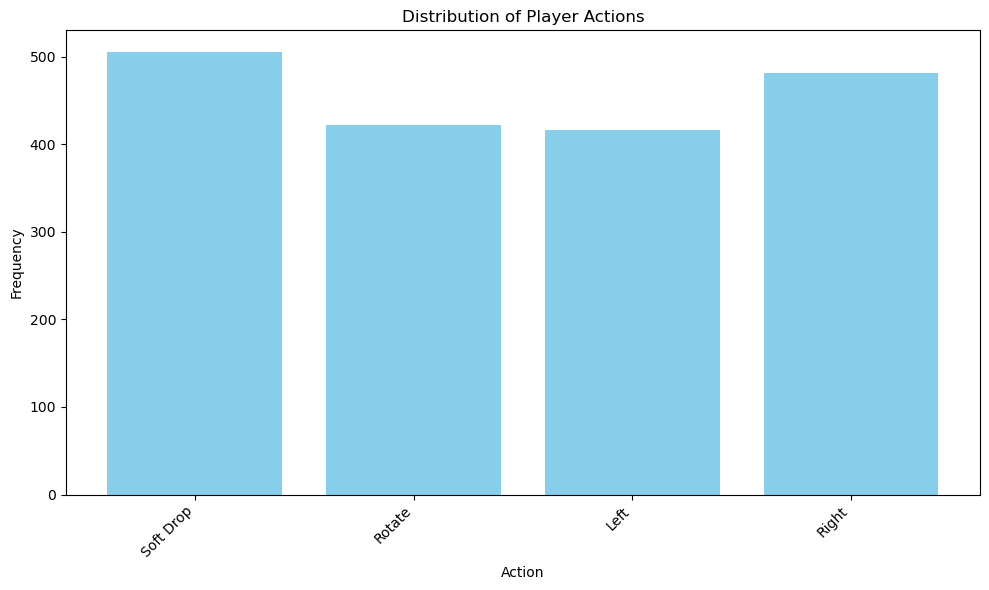

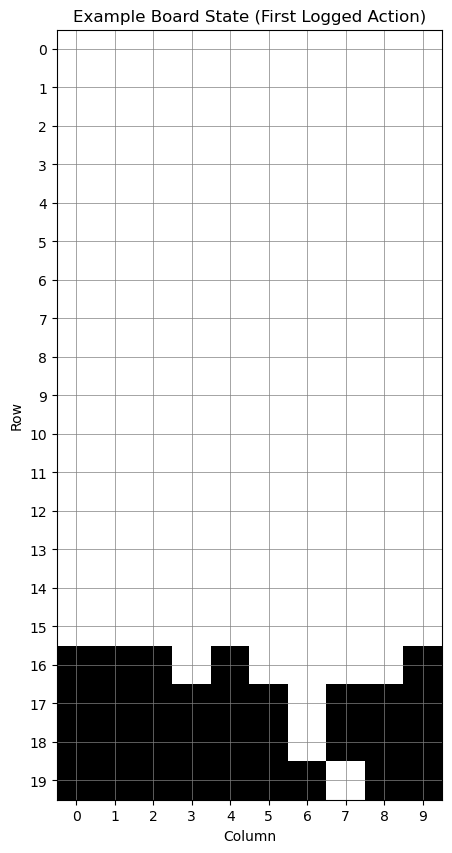

Analysis complete. Please upload 'analyze_tetris_data.ipynb' to Google Colab to run.


In [7]:
import json
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
import pygame # To map action keys to names

# Define a mapping for Pygame keys to readable names
ACTION_MAP = {
    pygame.K_LEFT: "Left",
    pygame.K_RIGHT: "Right",
    pygame.K_UP: "Rotate",
    pygame.K_DOWN: "Soft Drop",
    # Add other keys if they are logged
}

def get_action_name(key_code):
    return ACTION_MAP.get(key_code, f"Unknown Key ({key_code})")

# Load the data
file_path = 'tetris_training_data.json'
try:
    with open(file_path, 'r') as f:
        data = json.load(f)
    print(f"Successfully loaded {len(data)} data points from {file_path}")
except FileNotFoundError:
    print(f"Error: {file_path} not found. Please ensure you have run the NNAI Player mode in the Tetris game to generate data.")
    data = []
except json.JSONDecodeError:
    print(f"Error: Could not decode JSON from {file_path}. File might be corrupted or empty.")
    data = []

if not data:
    print("No data to analyze. Exiting.")
else:
    # --- Basic Data Overview ---
    print("\n--- Data Overview ---")
    print(f"Total logged actions: {len(data)}")
    
    # Example of a single data point
    if data:
        print("\nExample Data Point:")
        for key, value in data[0].items():
            if key == "board_state":
                print(f"  {key}: (2D array of shape {np.array(value).shape})")
            else:
                print(f"  {key}: {value}")

    # --- Analysis of Actions ---
    print("\n--- Action Analysis ---")
    actions = [dp['action'] for dp in data]
    action_counts = Counter(actions)
    
    print("Action Distribution:")
    for action_code, count in action_counts.most_common():
        print(f"  {get_action_name(action_code)} ({action_code}): {count} ({count/len(data)*100:.2f}%) ")

    # --- Analysis of Block Types ---
    print("\n--- Block Type Analysis ---")
    current_block_shapes = [dp['current_block_shape'] for dp in data if dp['current_block_shape']]
    next_block_shapes = [dp['next_block_shape'] for dp in data if dp['next_block_shape']]
    
    current_block_counts = Counter(current_block_shapes)
    next_block_counts = Counter(next_block_shapes)

    print("Current Block Shape Distribution:")
    for shape, count in current_block_counts.most_common():
        print(f"  {shape}: {count} ({count/len(current_block_shapes)*100:.2f}%) ")

    print("\nNext Block Shape Distribution:")
    for shape, count in next_block_counts.most_common():
        print(f"  {shape}: {count} ({count/len(next_block_shapes)*100:.2f}%) ")

    # --- Visualization: Action Distribution (Bar Chart) ---
    print("\n--- Generating Visualizations ---")
    action_names = [get_action_name(code) for code in action_counts.keys()]
    counts = list(action_counts.values())

    plt.figure(figsize=(10, 6))
    plt.bar(action_names, counts, color='skyblue')
    plt.xlabel('Action')
    plt.ylabel('Frequency')
    plt.title('Distribution of Player Actions')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    # --- Visualization: Board State (Example) ---
    # This will show the board state for the first logged action
    import random as r
    random_data_moment = r.choice(range(300,2000))
    if data and 'board_state' in data[random_data_moment]:
        first_board_state = np.array(data[random_data_moment]['board_state'])
        plt.figure(figsize=(8, 10))
        plt.imshow(first_board_state, cmap='binary', origin='upper')
        plt.title('Example Board State (First Logged Action)')
        plt.xlabel('Column')
        plt.ylabel('Row')
        plt.xticks(np.arange(first_board_state.shape[1]))
        plt.yticks(np.arange(first_board_state.shape[0]))
        plt.grid(True, color='gray', linewidth=0.5)
        plt.show()
    else:
        print("Skipping board state visualization: No board state found in data.")

    print("Analysis complete. Please upload 'analyze_tetris_data.ipynb' to Google Colab to run.")

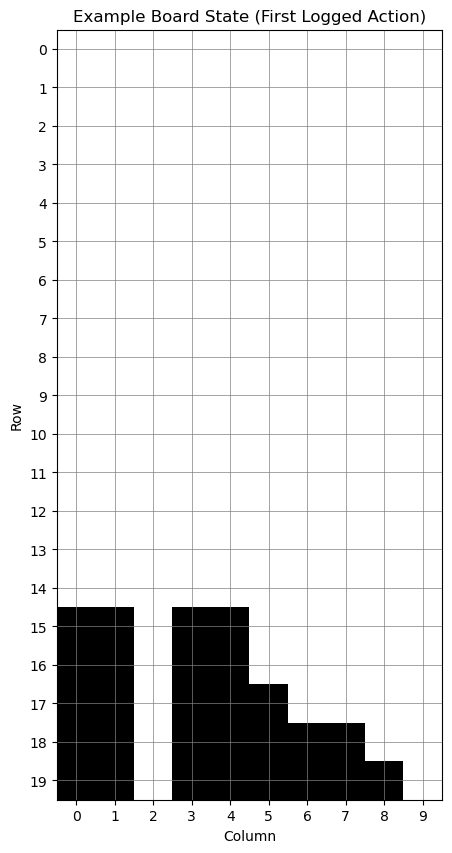

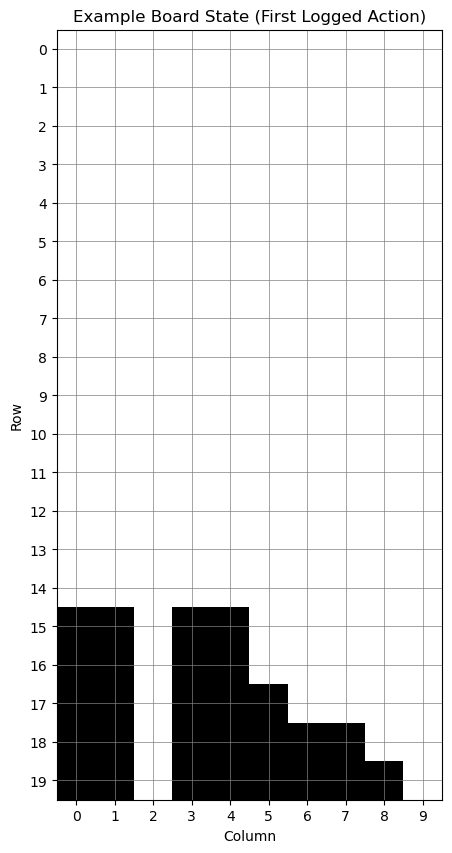

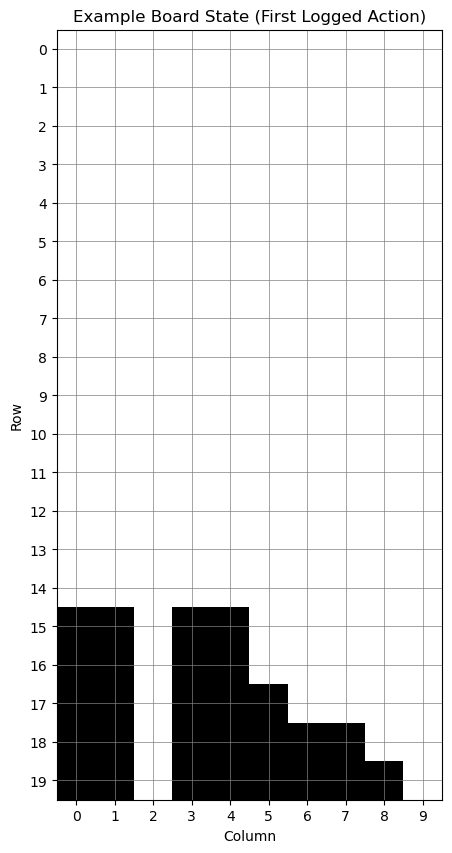

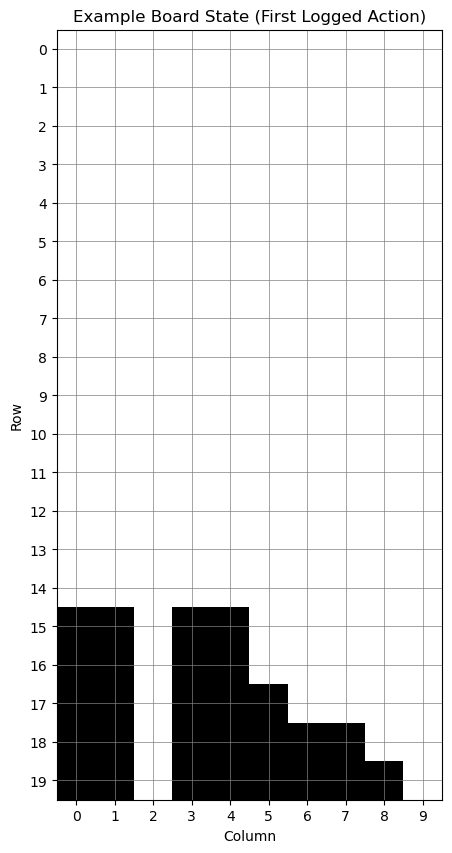

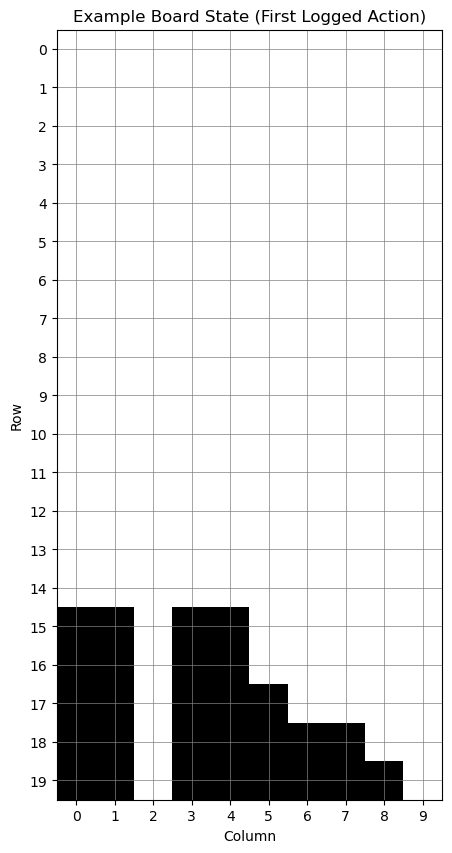

[None, None, None, None, None]

In [21]:
def plot_table(data_point):
    if data and 'board_state' in data[data_point]:
        first_board_state = np.array(data[data_point]['board_state'])
        plt.figure(figsize=(8, 10))
        plt.imshow(first_board_state, cmap='binary', origin='upper')
        plt.title('Example Board State (First Logged Action)')
        plt.xlabel('Column')
        plt.ylabel('Row')
        plt.xticks(np.arange(first_board_state.shape[1]))
        plt.yticks(np.arange(first_board_state.shape[0]))
        plt.grid(True, color='gray', linewidth=0.5)
        plt.show()
        #plt.plot()

[plot_table(i) for i in range(300,305)]


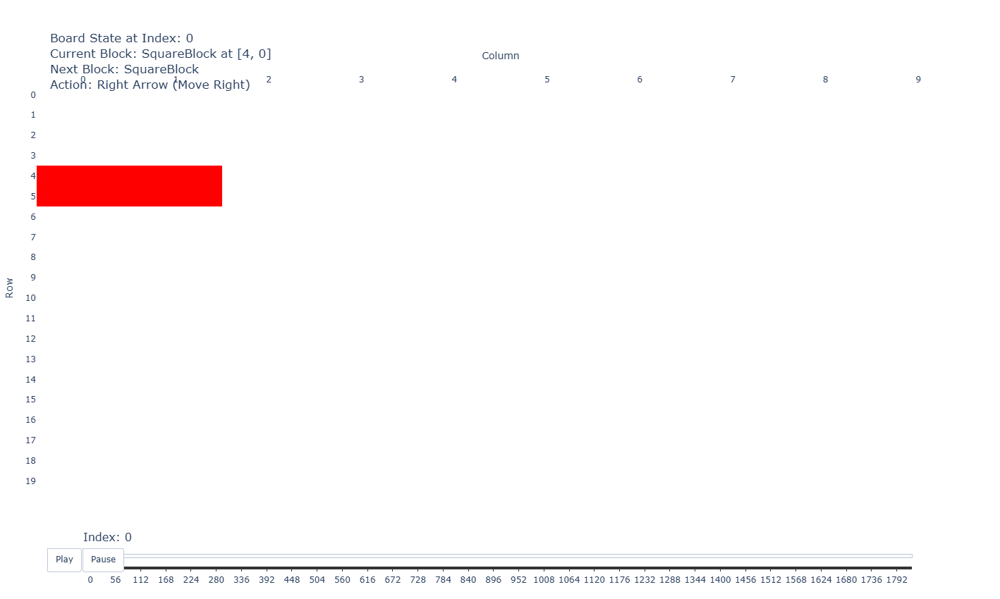

In [28]:
import plotly.graph_objects as go
import numpy as np

block_shapes = {
    'SquareBlock': [[0, 0], [0, 1], [1, 0], [1, 1]],
    'IBlock': [[0, 0], [1, 0], [2, 0], [3, 0]], # Vertical I-block
    'TBlock': [[0, 1], [1, 0], [1, 1], [1, 2]],
    'LBlock': [[0, 0], [1, 0], [2, 0], [2, 1]],
    'JBlock': [[0, 1], [1, 1], [2, 1], [2, 0]],
    'SBlock': [[0, 1], [0, 2], [1, 0], [1, 1]],
    'ZBlock': [[0, 0], [0, 1], [1, 1], [1, 2]],
    # Add other block shapes if they might appear in your full dataset
}

# Map action codes (e.g., keyboard key codes) to descriptive strings
action_map = {
    1073741903: "Left Arrow (Move Left)",
    1073741904: "Up Arrow (Rotate)",
    1073741905: "Right Arrow (Move Right)",
    1073741906: "Down Arrow (Soft Drop)",
    32: "Spacebar (Hard Drop)",
    # Add other action codes if they appear in your dataset
    -1: "No Action / Initial State", # Placeholder for states without explicit action
}

def plot_interactive_tetris_board(data_points_list):
    """
    Creates an interactive Plotly visualization of Tetris board states over time.
    The plot includes a slider to navigate through data points, play/pause buttons,
    and displays the board, current block, next block, and player action.

    Args:
        data_points_list (list): A list of dictionaries, where each dictionary
                                 contains 'board_state', 'current_block_shape',
                                 'current_block_pos', 'next_block_shape', and 'action'.
    """
    if not data_points_list:
        print("No data points provided for plotting.")
        return

    frames = []
    num_rows = len(data_points_list[0]['board_state'])
    num_cols = len(data_points_list[0]['board_state'][0])

    # Define the colorscale for the heatmap.
    # We'll map the integer values in the board_state to specific colors:
    # 0: Empty cell (white)
    # 1: Occupied cell (black)
    # 2: Current moving block (red)
    # Plotly's Heatmap scales `z` values to [0,1] for colorscale lookup.
    # So, 0 -> 0.0, 1 -> 0.5, 2 -> 1.0 on this scale.
    colorscale = [
        [0.0, 'white'],  # Value 0 (empty) maps to white
        [0.49, 'white'], # Keep white up to just before 1
        [0.5, 'black'],  # Value 1 (occupied) maps to black
        [0.99, 'black'], # Keep black up to just before 2
        [1.0, 'red'],    # Value 2 (current block) maps to red
        [1.0, 'red']     # Ensure 2 is consistently red
    ]

    # Prepare frames for the animation/slider
    for i, dp in enumerate(data_points_list):
        # Create a copy of the board state to modify for the current block
        board_state = np.array(dp['board_state'], dtype=int)
        current_block_shape_name = dp['current_block_shape']
        current_block_pos = dp['current_block_pos']
        next_block_shape_name = dp['next_block_shape']
        action_code = dp['action']
        action_desc = action_map.get(action_code, f"Unknown Action ({action_code})")

        # Overlay the current block onto the board state with a distinct color (value 2)
        if current_block_shape_name in block_shapes:
            block_cells = block_shapes[current_block_shape_name]
            for r_offset, c_offset in block_cells:
                r = current_block_pos[0] + r_offset
                c = current_block_pos[1] + c_offset
                # Check if the block cell is within board bounds before marking
                if 0 <= r < num_rows and 0 <= c < num_cols:
                    board_state[r, c] = 2  # Mark current block cells with '2'

        # Create the heatmap trace for the current frame
        frame_trace = go.Heatmap(
            z=board_state,
            colorscale=colorscale,
            showscale=False,  # No need for a color bar
            hoverinfo='none', # Disable hover for individual cells to keep it clean
            zmin=0, zmax=2    # Explicitly set the minimum and maximum z values for consistent color mapping
        )

        # Define the title for the current frame, including all relevant information
        frame_title = (
            f"Board State at Index: {i}<br>"
            f"Current Block: {current_block_shape_name} at {current_block_pos}<br>"
            f"Next Block: {next_block_shape_name}<br>"
            f"Action: {action_desc}"
        )

        # Add the frame to the list of frames
        frames.append(
            go.Frame(
                data=[frame_trace],
                name=str(i), # Name the frame with its index for slider reference
                layout=go.Layout(title_text=frame_title) # Update the title for this specific frame
            )
        )

    # Create the initial figure state (which will be the first frame)
    initial_dp = data_points_list[0]
    initial_board_state = np.array(initial_dp['board_state'], dtype=int)
    initial_current_block_shape_name = initial_dp['current_block_shape']
    initial_current_block_pos = initial_dp['current_block_pos']
    initial_next_block_shape_name = initial_dp['next_block_shape']
    initial_action_code = initial_dp['action']
    initial_action_desc = action_map.get(initial_action_code, f"Unknown Action ({initial_action_code})")

    # Overlay initial current block
    if initial_current_block_shape_name in block_shapes:
        block_cells = block_shapes[initial_current_block_shape_name]
        for r_offset, c_offset in block_cells:
            r = initial_current_block_pos[0] + r_offset
            c = initial_current_block_pos[1] + c_offset
            if 0 <= r < num_rows and 0 <= c < num_cols:
                initial_board_state[r, c] = 2

    # Initialize the Plotly figure
    fig = go.Figure(
        data=[go.Heatmap(
            z=initial_board_state,
            colorscale=colorscale,
            showscale=False,
            hoverinfo='none',
            zmin=0, zmax=2
        )],
        layout=go.Layout(
            title_text=( # Initial title
                f"Board State at Index: 0<br>"
                f"Current Block: {initial_current_block_shape_name} at {initial_current_block_pos}<br>"
                f"Next Block: {initial_next_block_shape_name}<br>"
                f"Action: {initial_action_desc}"
            ),
            xaxis=dict(
                tickmode='array',
                tickvals=np.arange(num_cols),
                ticktext=[str(j) for j in np.arange(num_cols)],
                side='top', # Column labels on top
                showgrid=True,
                zeroline=False,
                fixedrange=True, # Prevent horizontal zooming
                title_text="Column"
            ),
            yaxis=dict(
                tickmode='array',
                tickvals=np.arange(num_rows),
                ticktext=[str(j) for j in np.arange(num_rows)],
                autorange='reversed', # Make (0,0) at top-left, typical for grids
                showgrid=True,
                zeroline=False,
                fixedrange=True, # Prevent vertical zooming
                title_text="Row"
            ),
            # Adjust plot size to make cells appear square and fit content
            autosize=False,
            width=num_cols * 35 + 150, # Heuristic for good cell size and margins
            height=num_rows * 35 + 150,
            margin=dict(l=50, r=50, t=120, b=50), # Adjust margins, especially top for title
            updatemenus=[{ # Play/Pause buttons
                'type': 'buttons',
                'buttons': [
                    {
                        'label': 'Play',
                        'method': 'animate',
                        # Animation arguments: duration per frame, redraw, transition
                        'args': [None, {'frame': {'duration': 500, 'redraw': True}, 'fromcurrent': True, 'transition': {'duration': 300, 'easing': 'quadratic-in-out'}}]
                    },
                    {
                        'label': 'Pause',
                        'method': 'animate',
                        'args': [[None], {'frame': {'duration': 0, 'redraw': True}, 'mode': 'immediate', 'transition': {'duration': 0}}]
                    }
                ],
                'direction': 'left',
                'pad': {'r': 10, 't': 80}, # Position for the buttons
                'showactive': False,
                'x': 0.1,
                'xanchor': 'right',
                'y': 0,
                'yanchor': 'top'
            }],
            sliders=[{ # Slider to select data points
                'steps': [
                    {
                        'method': 'animate',
                        'label': str(k), # Label for each step (index)
                        # Arguments to jump to a specific frame immediately
                        'args': [[str(k)], {'mode': 'immediate', 'frame': {'duration': 0, 'redraw': True}, 'transition': {'duration': 0}}]
                    } for k in range(len(data_points_list))
                ],
                'active': 0, # Start at the first data point
                'transition': {'duration': 0},
                'x': 0.05,
                'y': 0,
                'len': 0.9, # Length of the slider
                'currentvalue': {'font': {'size': 16}, 'prefix': 'Index: ', 'visible': True},
                'pad': {'b': 10, 't': 50} # Padding for the slider
            }]
        ),
        frames=frames # Add all prepared frames to the figure
    )
    fig.show()

# Example usage with your provided data:
# If you have a larger dataset and want to plot a specific range (e.g., indices 300 to 305),
# you would slice your main 'data' list like this:
# plot_interactive_tetris_board(full_data[300:305])

# For the provided 'data' variable, we plot all its entries:
plot_interactive_tetris_board(data)